# **Imports**

In [46]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# **Reading Data**

In [3]:
data = pd.read_csv('../Data/final_combined_data.csv')

In [4]:
data.columns

Index(['Latitude', 'Longitude', 'Altitude', 'Distance', 'Alignment',
       'Distance_Sensors', 'Proximity', 'Wheel_Speed', 'Velocity',
       'Hall_Effect', 'Emergency_Stop', 'Temperature', 'Humidity',
       'Light_Level', 'Alignment_Label', 'Safety_Label',
       'Collision_Avoidance_Label', 'Chaining_Unchaining_Label'],
      dtype='object')

In [5]:
# Scatter plot of Latitude vs. Longitude
scatter_fig = px.scatter(data, x='Longitude', y='Latitude', title='Scatter Plot of Latitude vs. Longitude')
scatter_fig.show()

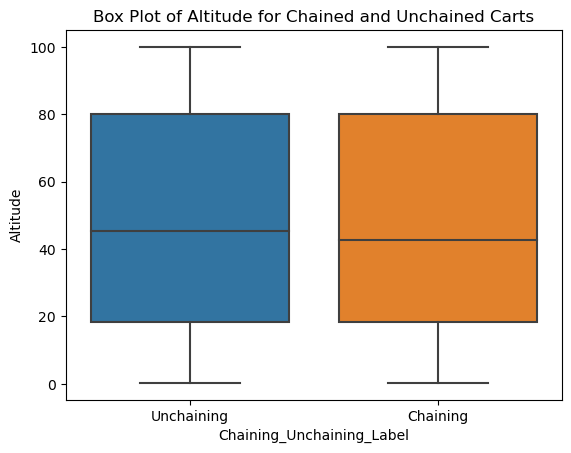

In [56]:
# Box Plot of Altitude for Chained and Unchained Carts
sns.boxplot(data=data, x='Chaining_Unchaining_Label', y='Altitude')
plt.title('Box Plot of Altitude for Chained and Unchained Carts')
plt.show()

In [7]:
# Create a histogram of Distance_Sensors
histogram_distance = px.histogram(data, x='Distance', title='Histogram of Distance Measures')
histogram_distance.show()


In [8]:
# Bar chart of Alignment Label counts
alignment_counts = data['Alignment_Label'].value_counts().reset_index()
alignment_counts.columns = ['Alignment_Label', 'Count']
bar_fig = px.bar(alignment_counts, x='Alignment_Label', y='Count', color='Alignment_Label', title='Bar Chart of Alignment Label Counts')
bar_fig.show()

In [9]:
# Pie chart of Safety Label distribution
safety_counts = data['Safety_Label'].value_counts().reset_index()
safety_counts.columns = ['Safety_Label', 'Count']
pie_fig = px.pie(safety_counts, values='Count', names='Safety_Label', title='Pie Chart of Safety Label Distribution')
pie_fig.show()

In [10]:
# Bar chart of Collision Avoidance Label counts
alignment_counts = data['Collision_Avoidance_Label'].value_counts().reset_index()
alignment_counts.columns = ['Collision_Avoidance_Label', 'Count']
bar_fig = px.bar(alignment_counts, x='Collision_Avoidance_Label', y='Count', color='Collision_Avoidance_Label', title='Bar Chart of Collision Avoidance Label Counts')
bar_fig.show()

In [11]:
# Box plot of Wheel Speed
box_wheel_speed = px.box(data, y='Wheel_Speed', title='Box Plot of Wheel Speed')
box_wheel_speed.show()

In [12]:
# Box plot of Velocity
box_velocity = px.box(data, y='Velocity', title='Box Plot of Velocity')
box_velocity.show()

In [13]:
# Create a scatter plot with marginal histograms
scatter_histogram_temperature_vs_humidity = px.scatter(data, x='Temperature', y='Humidity',
                                                       title='Scatter Plot of Temperature vs. Humidity',
                                                       opacity=0.3,
                                                       marginal_x='histogram', marginal_y='histogram')
scatter_histogram_temperature_vs_humidity.show()

In [14]:
# Box plot of Light Level
box_light_level = px.box(data, y='Light_Level', title='Box Plot of Light Level')
box_light_level.show()

In [15]:
# Bar chart of Proximity counts
proximity_counts = data['Proximity'].value_counts().reset_index()
proximity_counts.columns = ['Proximity', 'Count']
bar_fig = px.bar(proximity_counts, x='Proximity', y='Count', color='Proximity', title='Bar Chart of Proximity (no nearby obstacle or object) Counts')
bar_fig.show()

In [16]:
# Create bar charts for Hall Effect and Emergency Stop counts
hall_effect_counts = data['Hall_Effect'].value_counts().reset_index()
hall_effect_counts.columns = ['Hall_Effect', 'Count']

emergency_stop_counts = data['Emergency_Stop'].value_counts().reset_index()
emergency_stop_counts.columns = ['Emergency_Stop', 'Count']

# Create subplots
fig = make_subplots(rows=1, cols=2)

# Add Hall Effect bar chart to the first subplot
fig.add_trace(go.Bar(x=hall_effect_counts['Hall_Effect'], y=hall_effect_counts['Count'], name='Hall Effect'),
              row=1, col=1)

# Add Emergency Stop bar chart to the second subplot
fig.add_trace(go.Bar(x=emergency_stop_counts['Emergency_Stop'], y=emergency_stop_counts['Count'], name='Emergency Stop'),
              row=1, col=2)

# Update layout
fig.update_layout(title_text='Bar Charts of Safety Measures (Hall Effect and Emergency Stop) Counts', showlegend=False)

# Show the combined figure
fig.show()

In [17]:
# Create a histogram of Distance_Sensors
histogram_distance_sensors = px.histogram(data, x='Distance_Sensors', title='Histogram of Distance Sensors')
histogram_distance_sensors.show()

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Latitude                   50000 non-null  float64
 1   Longitude                  50000 non-null  float64
 2   Altitude                   50000 non-null  float64
 3   Distance                   50000 non-null  float64
 4   Alignment                  50000 non-null  bool   
 5   Distance_Sensors           50000 non-null  float64
 6   Proximity                  50000 non-null  bool   
 7   Wheel_Speed                50000 non-null  float64
 8   Velocity                   50000 non-null  float64
 9   Hall_Effect                50000 non-null  bool   
 10  Emergency_Stop             50000 non-null  bool   
 11  Temperature                50000 non-null  float64
 12  Humidity                   50000 non-null  float64
 13  Light_Level                50000 non-null  flo

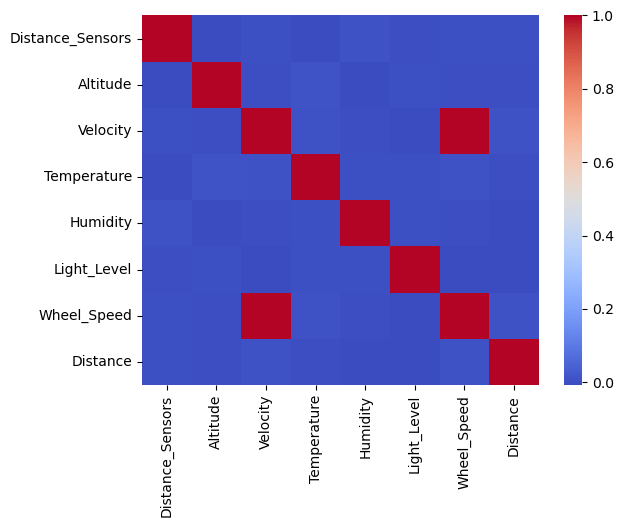

In [28]:
numerical_columns = ['Distance_Sensors', 'Altitude', 'Velocity', 'Temperature', 'Humidity',
                     'Light_Level', 'Wheel_Speed', 'Distance']

corr_matrix = data[numerical_columns].corr()
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm')
plt.show()

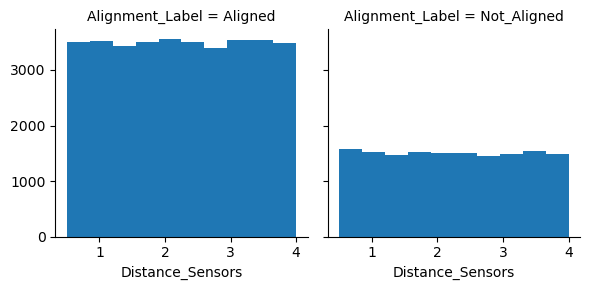

In [32]:
g = sns.FacetGrid(data, col='Alignment_Label', margin_titles=True)
g.map(plt.hist, 'Distance_Sensors')
plt.show()

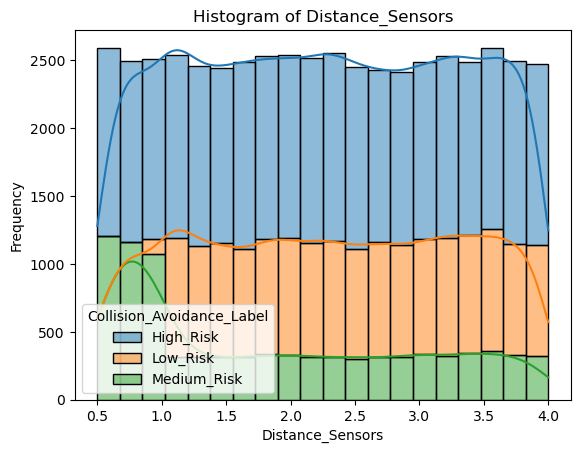

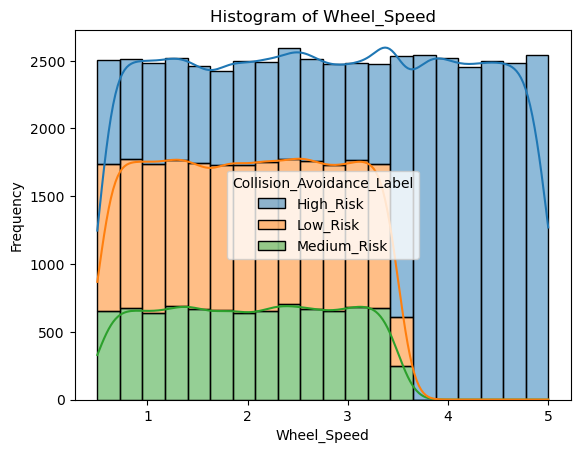

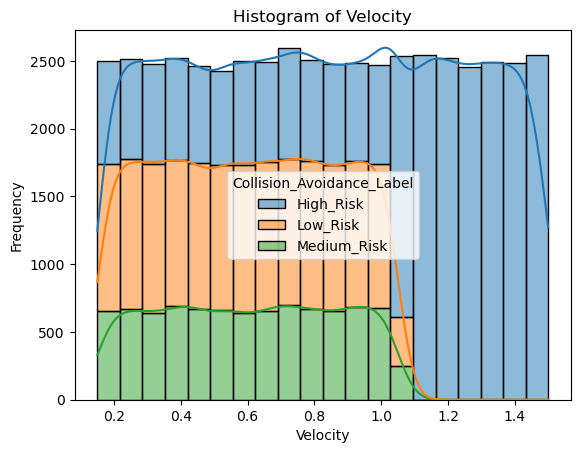

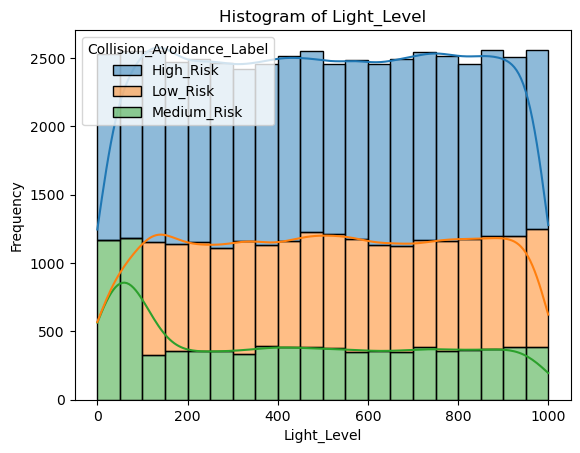

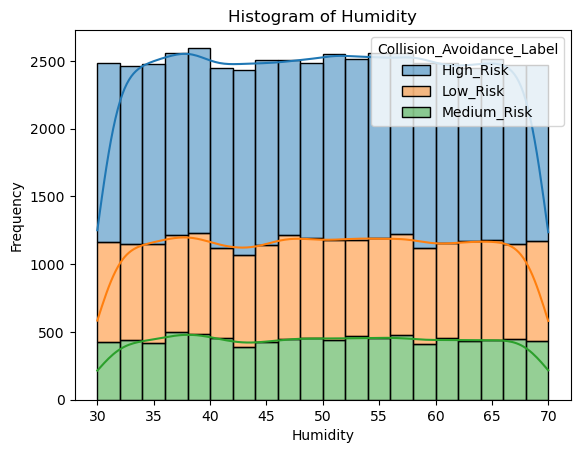

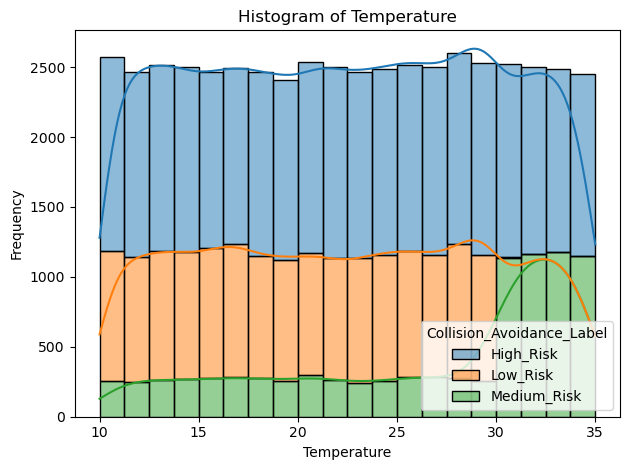

In [37]:
variables = ['Distance_Sensors', 'Wheel_Speed', 'Velocity', 'Light_Level', 'Humidity', 'Temperature']

for var in variables:
    plt.figure()
    sns.histplot(data=data, x=var, hue='Collision_Avoidance_Label', multiple="stack", bins=20, kde=True)
    plt.title(f"Histogram of {var}")
    plt.xlabel(var)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

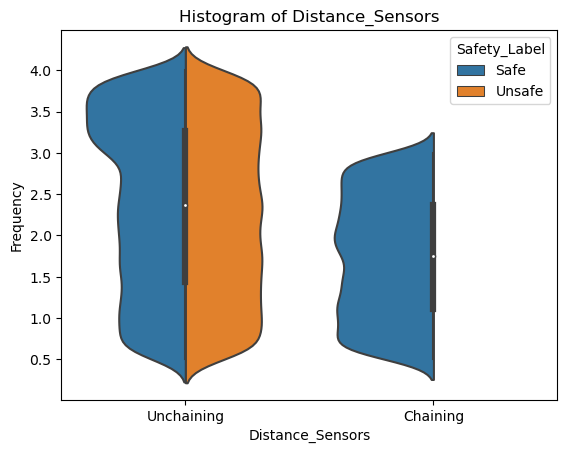

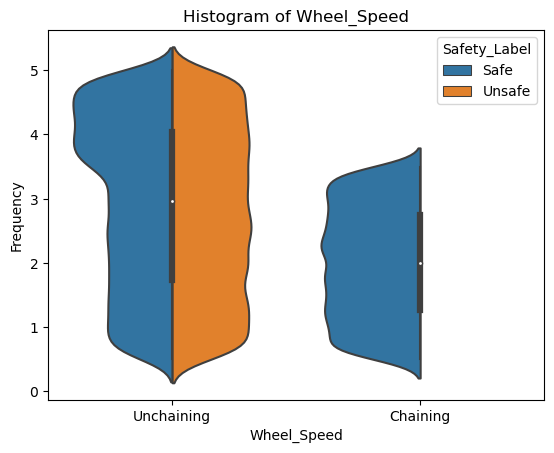

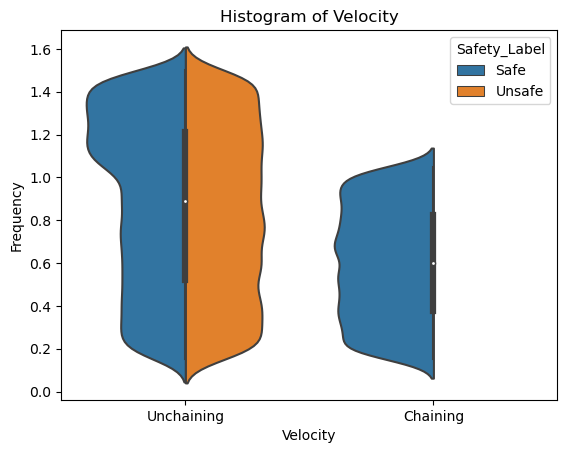

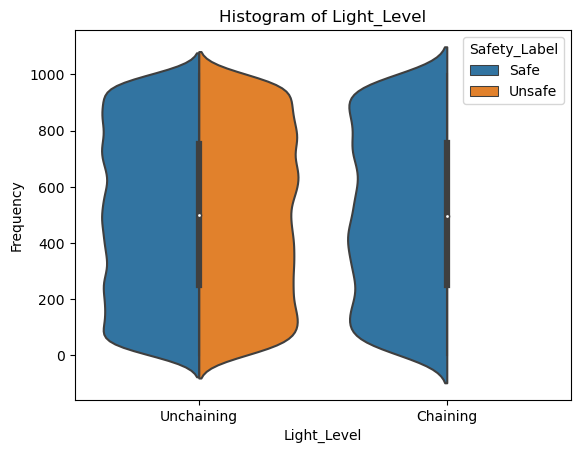

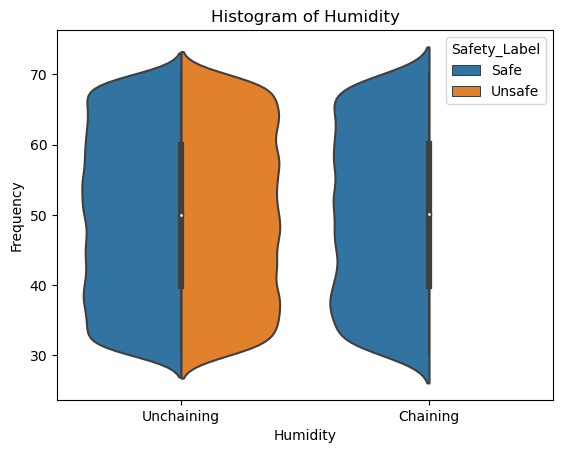

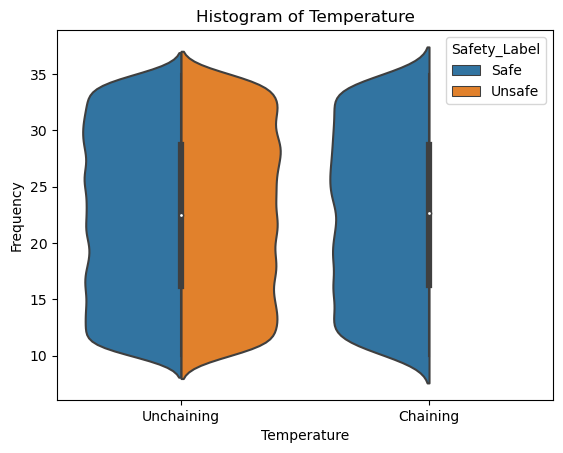

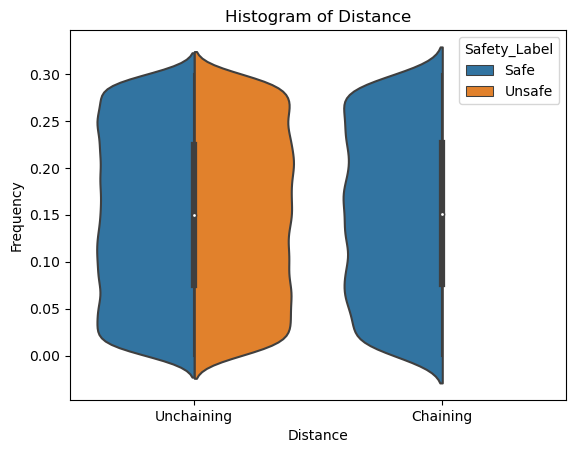

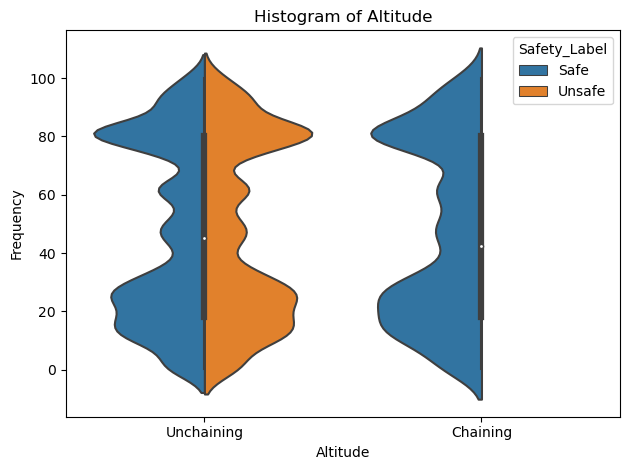

In [45]:
variables = ['Distance_Sensors', 'Wheel_Speed', 'Velocity', 'Light_Level', 
             'Humidity', 'Temperature', 'Distance', 'Altitude']

for var in variables:
    plt.figure()
    sns.violinplot(data=data, x='Chaining_Unchaining_Label', y=var, hue='Safety_Label', split=True)
    plt.title(f"Histogram of {var}")
    plt.xlabel(var)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

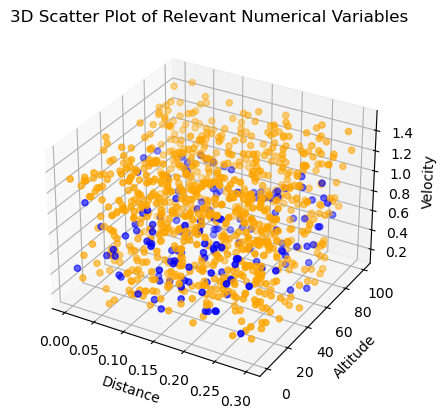

In [65]:
subset_data = data.sample(n=1000) 

label_to_color = {'Chaining': 'blue', 'Unchaining': 'orange'}

colors = subset_data['Chaining_Unchaining_Label'].map(label_to_color)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(subset_data['Distance'], subset_data['Altitude'], subset_data['Velocity'], c=colors)
ax.set_xlabel('Distance')
ax.set_ylabel('Altitude')
ax.set_zlabel('Velocity')
plt.title('3D Scatter Plot of Relevant Numerical Variables')
plt.show()

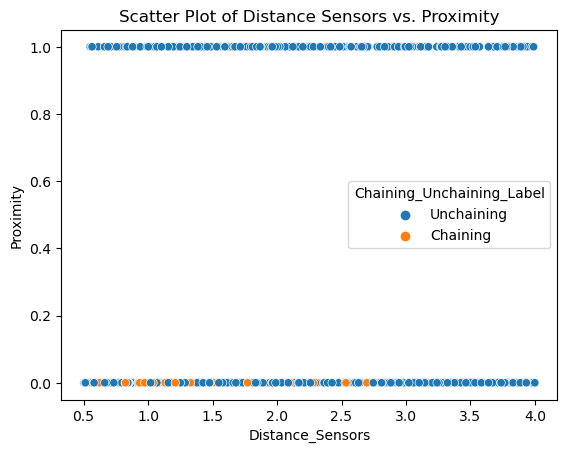

In [58]:
# Scatter Plot of Distance vs. Proximity
sns.scatterplot(data=subset_data, x='Distance_Sensors', y='Proximity', hue='Chaining_Unchaining_Label')
plt.title('Scatter Plot of Distance Sensors vs. Proximity')
plt.show()

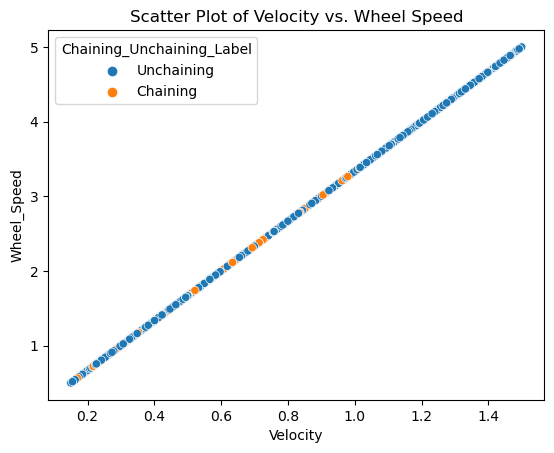

In [55]:
# Scatter Plot of Velocity vs. Wheel Speed
sns.scatterplot(data=data, x='Velocity', y='Wheel_Speed', hue='Chaining_Unchaining_Label')
plt.title('Scatter Plot of Velocity vs. Wheel Speed')
plt.show()

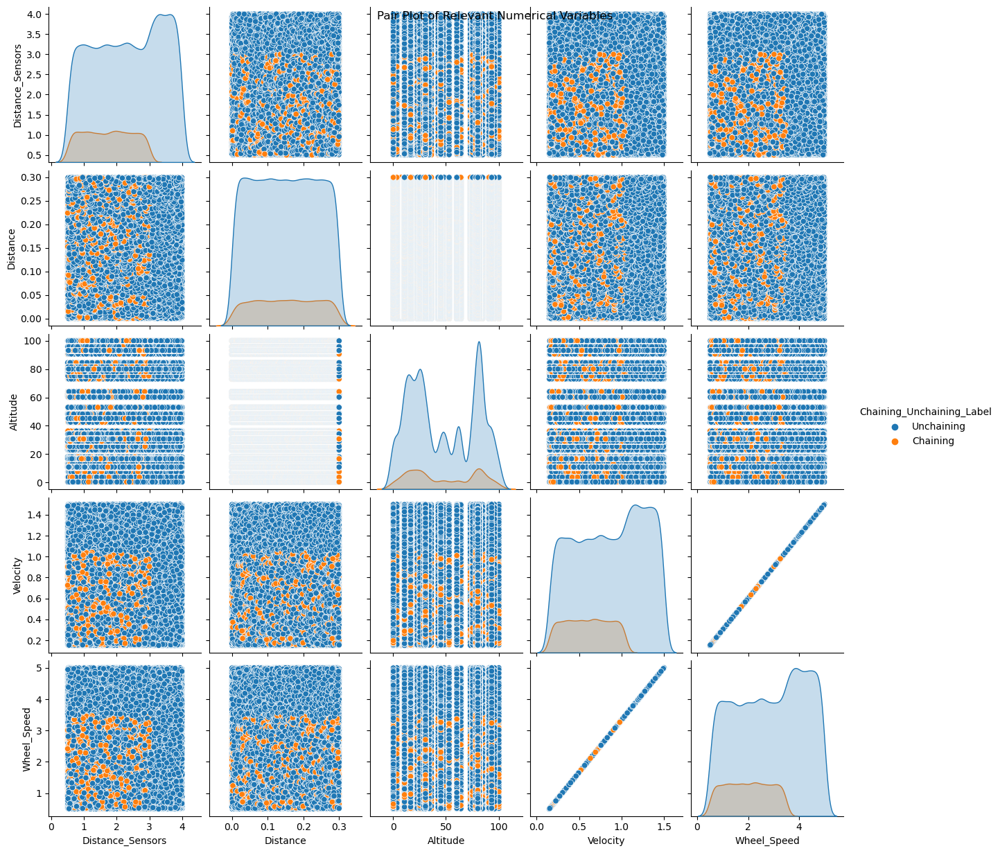

In [59]:
numerical_variables = ['Distance_Sensors' ,'Distance', 'Altitude', 'Velocity', 'Wheel_Speed']
sns.pairplot(data=data, vars=numerical_variables, hue='Chaining_Unchaining_Label')
plt.suptitle('Pair Plot of Relevant Numerical Variables')
plt.show()